In [1]:
import os
import numpy as np
import healpy as hp
import glob
from matplotlib import pyplot as plt
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec

from src.utils import find_data_dirs
from src.info_extractor import InfoExtractor
from src.stats_merger import StatsMerger

In [2]:
data_dirs = find_data_dirs()

In [3]:
def plot_kappa(files, datadir):
    zs_order = [0.5, 1, 2]
    noise_order = np.array(["noiseless", "ngal50", "ngal30", "ngal15", "ngal7"])
    smoothing_order = np.array([None, 2, 5, 8, 10])

    # 3 redshift x (4 smoothing scale x 5 noise scale) panels
    fig = plt.figure(figsize=(15, 5))
    gs_master = GridSpec(1, 3, figure=fig, wspace=0.1)
    gs_zs05 = GridSpecFromSubplotSpec(5, 5, subplot_spec=gs_master[0], wspace=0.1, hspace=0)
    gs_zs1 = GridSpecFromSubplotSpec(5, 5, subplot_spec=gs_master[1], wspace=0.1, hspace=0)
    gs_zs2 = GridSpecFromSubplotSpec(5, 5, subplot_spec=gs_master[2], wspace=0.1, hspace=0)

    for file in files:
        data = np.load(file, mmap_mode="r")
        info = InfoExtractor.extract_info_from_path(file)
        zs = info["redshift"]
        sl = info["sl"]
        sl_idx = np.where(smoothing_order == sl)[0][0]
        ngal = info["ngal"]
        noise = f"ngal{ngal}" if ngal != 0 else "noiseless"
        noise_idx = np.where(noise_order == noise)[0][0]

        if zs == 0.5:
            gs = gs_zs05
        elif zs == 1:
            gs = gs_zs1
        else:
            gs = gs_zs2

        ax = fig.add_subplot(gs[sl_idx, noise_idx])
        ax.imshow(data[0], vmin=-0.024, vmax=0.024)
        #ax.set_title(f"{zs}, {sl}, {ngal}", fontsize=8)
        ax.axis("off")

    output_path = os.path.join(datadir, "img", "patches.png")
    fig.savefig(output_path, bbox_inches="tight")

    plt.close()

In [60]:
for datadir in data_dirs[10:]:
    files = glob.glob(os.path.join(datadir, "patch_snr", "*.npy")) + glob.glob(os.path.join(datadir, "patch_kappa", "*.npy"))
    plot_kappa(files, datadir)

In [58]:
data1 = hp.read_map("/lustre/work/akira.tokiwa/Projects/LensingSSC/data/bigbox/rfof_proc131072_nc6144_size3750_nsteps60lin_ldr0_rcvfalse_fstnone_pnf2_lnf2_s104_dhf1.0000_tiled0.20_fll_elllim_10000_npix_8192_rfofkdt_8/mass_sheets/delta-sheet-50.fits")

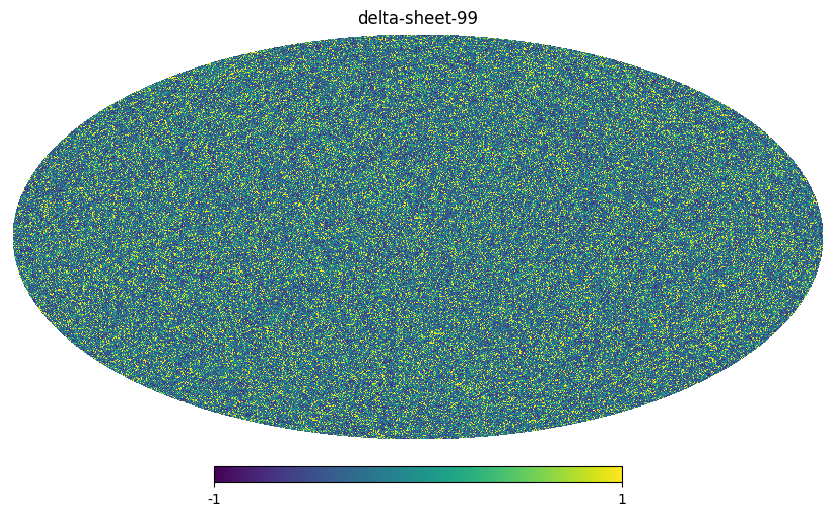

In [59]:
hp.mollview(data1, nest=True, title="delta-sheet-99", min=-1, max=1)

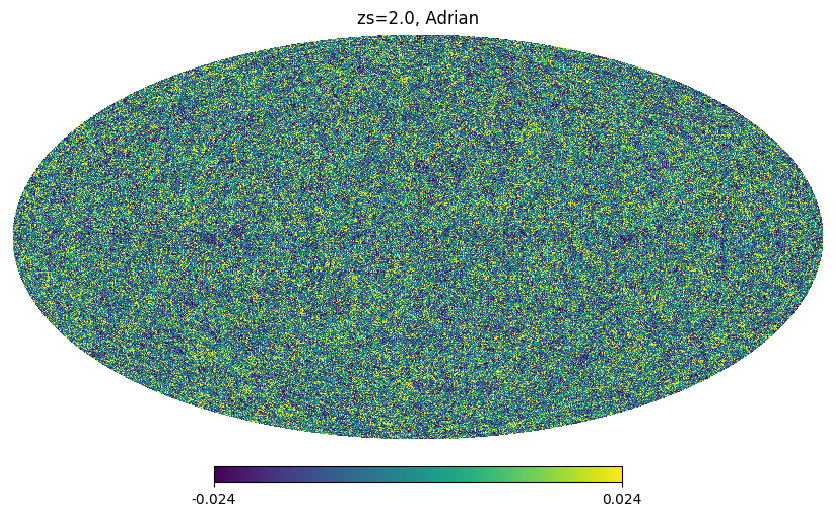

In [50]:
hp.mollview(data1, title="zs=2.0, Adrian", min=-0.024, max=0.024, nest=True)

In [51]:
data2 = hp.read_map("/lustre/work/akira.tokiwa/Projects/LensingSSC/data/tiled/proc2048_nc1024_size625_nsteps60_s203_10tiled/kappa/kappa_zs1.0_s203.fits")

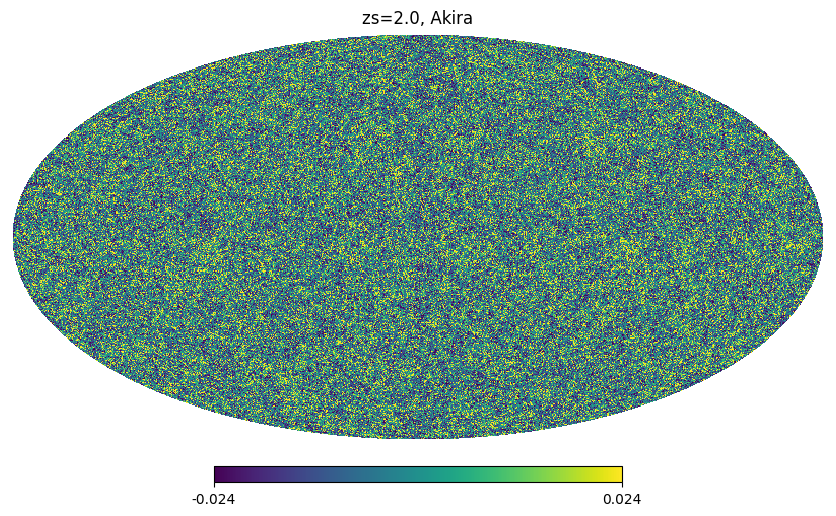

In [52]:
hp.mollview(data2, title="zs=2.0, Akira", min=-0.024, max=0.024, nest=True)

In [10]:
from src.patch_processor import PatchProcessor
from src.patch_analyser import PatchAnalyser

In [11]:
import logging
import numpy as np
from astropy import units as u
from lenstools import ConvergenceMap
import multiprocessing as mp

In [12]:
pp = PatchProcessor()
pa = PatchAnalyser(pp=pp)

In [34]:
conv_maps = [ConvergenceMap(patch_pixels, angle=pa.patch_size * u.deg) for patch_pixels in data]
conv_smoothed = [conv_map.smooth(2.0 * u.arcmin, kind="gaussian") for conv_map in conv_maps]

AttributeError: 'ConvergenceMap' object has no attribute 'kappa'

In [36]:
global_std = np.std([cs.data for cs in conv_smoothed])

In [41]:
i = 2

# Process kappa (convergence) map
conv_map = conv_maps[i]
squeezed_bispectrum = pa._compute_bispectrum(conv_map)
cl_power_spectrum = pa._compute_power_spectrum(conv_map)

# Process SNR map
snr_map = conv_smoothed[i].data / global_std
snr_map = ConvergenceMap(snr_map, angle=pa.patch_size * u.deg)
snr_map.smooth(2.0 * u.arcmin, kind="gaussian", inplace=True)
pdf_vals = pa._compute_pdf(snr_map)
peaks = pa._compute_peak_statistics(snr_map, is_minima=False)
minima = pa._compute_peak_statistics(snr_map, is_minima=True)

# Concatenate all computed statistics
data_tmp = np.hstack([squeezed_bispectrum, cl_power_spectrum, pdf_vals, peaks, minima])

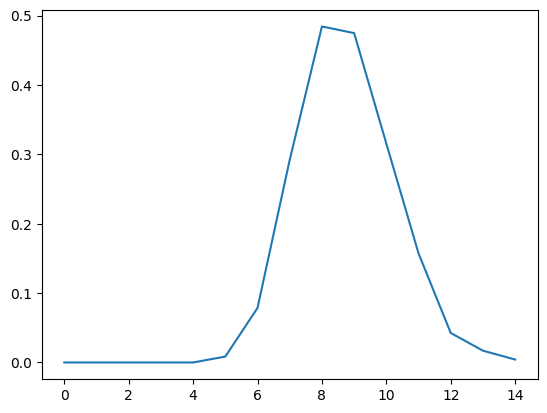

In [43]:
plt.plot(peaks)

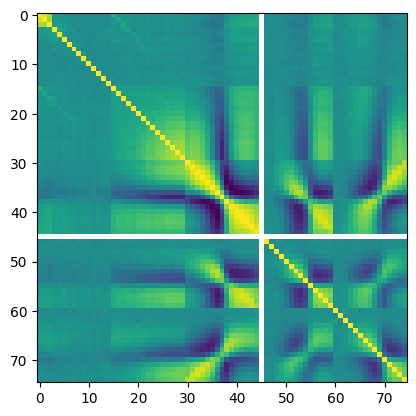

In [59]:
plt.imshow(data.item()[0.5]["corr"])

In [5]:
def plot_corr(fname, corr_tiled, corr_bigbox, title, title_tiled, title_bigbox, labels, vmin=-0.3, vmax=0.3):    
    nbin = corr_bigbox.shape[0] // len(labels)
    tick_positions = [nbin/2 + nbin * i for i in range(len(labels))]

    fig = plt.figure(figsize=(10, 4))
    gs_master = GridSpec(nrows=2, ncols=1, height_ratios=[1, 9])
    gs_plot = GridSpecFromSubplotSpec(1, 3, subplot_spec=gs_master[1], wspace=0.2)
    ax = [fig.add_subplot(gs_plot[i]) for i in range(3)]

    cax = ax[0].imshow(corr_tiled, cmap='bwr', vmin=-1, vmax=1)
    fig.colorbar(cax, ax=ax[0], shrink=0.6)
    ax[0].set_title(title_tiled, fontsize=10)

    cax = ax[1].imshow(corr_bigbox, cmap='bwr', vmin=-1, vmax=1)
    fig.colorbar(cax, ax=ax[1], shrink=0.6)
    ax[1].set_title(title_bigbox, fontsize=10)

    cax = ax[2].imshow(corr_bigbox - corr_tiled, cmap='bwr', vmin=vmin, vmax=vmax)
    fig.colorbar(cax, ax=ax[2], shrink=0.6)
    ax[2].set_title("BigBox - Tiled Correlation", fontsize=10)

    for axes in ax:
        axes.set_xticks(tick_positions, labels, fontsize=8)
        axes.set_yticks(tick_positions, labels, fontsize=8, rotation=90, va='center')
        axes.invert_yaxis()

    ax_title = fig.add_subplot(gs_master[0])
    ax_title.text(0.5, 0.5, title, fontsize=12, ha='center', va='center')
    ax_title.axis('off')

    fig.savefig(fname, bbox_inches='tight')
    print(f"Saved: {fname}")
    plt.show()
    plt.close(fig)


Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_ngal30_sl2.png


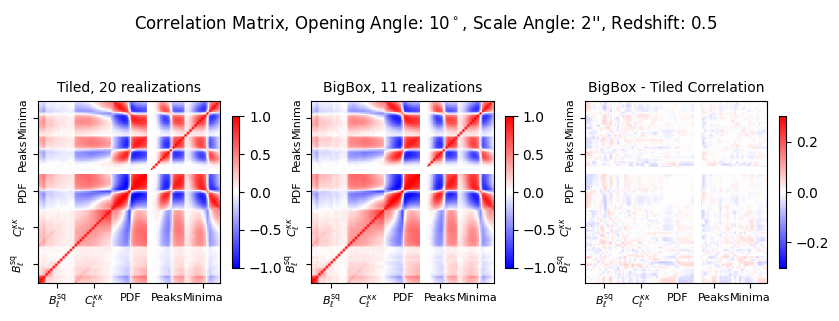

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_ngal30_sl2.png


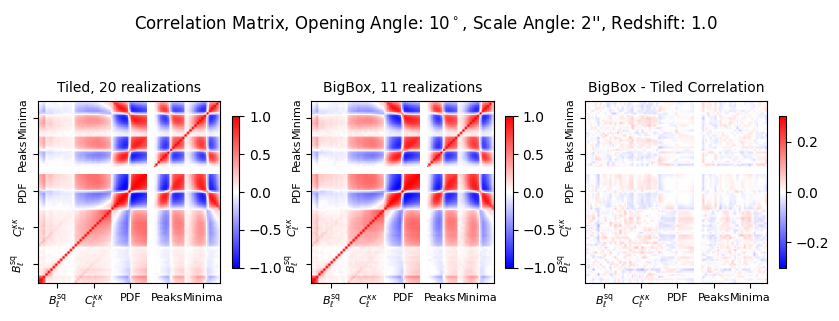

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_ngal30_sl2.png


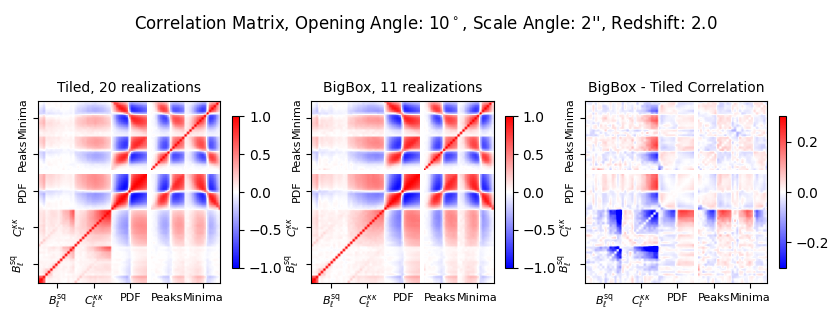

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_ngal15_sl10.png


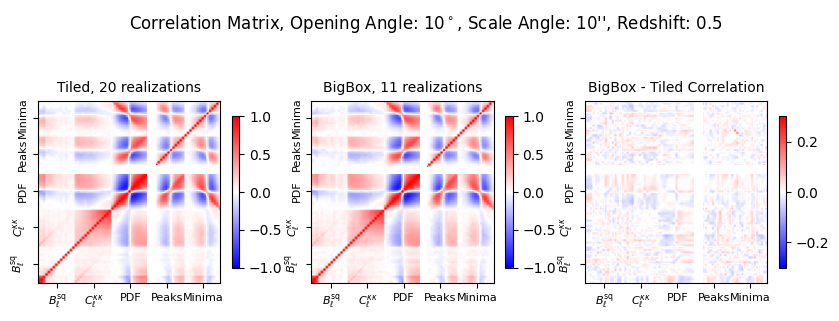

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_ngal15_sl10.png


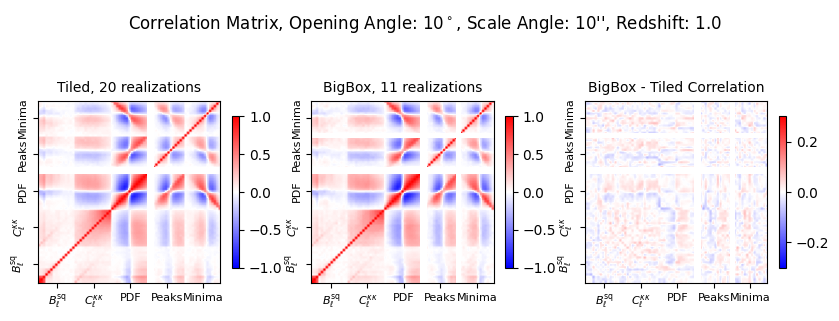

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_ngal15_sl10.png


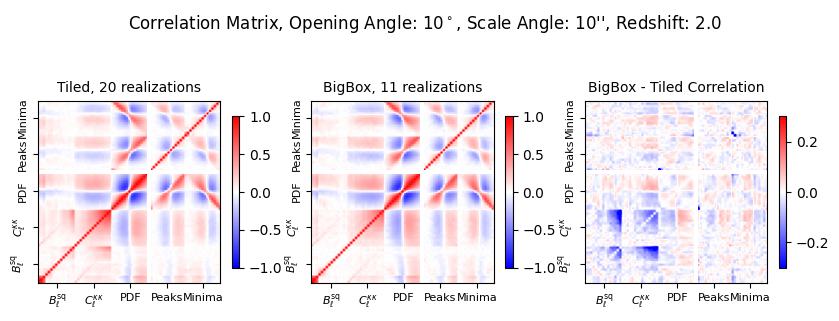

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_ngal7_sl2.png


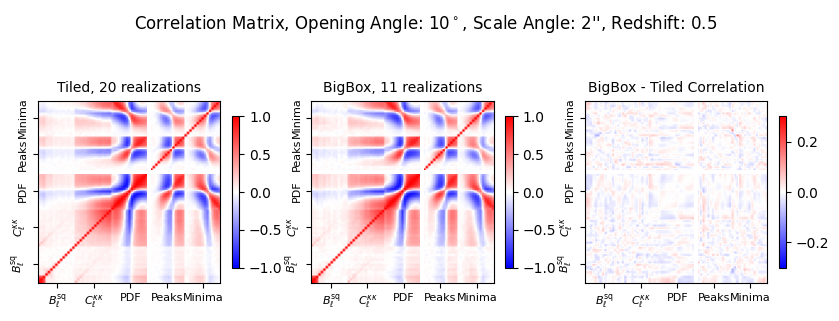

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_ngal7_sl2.png


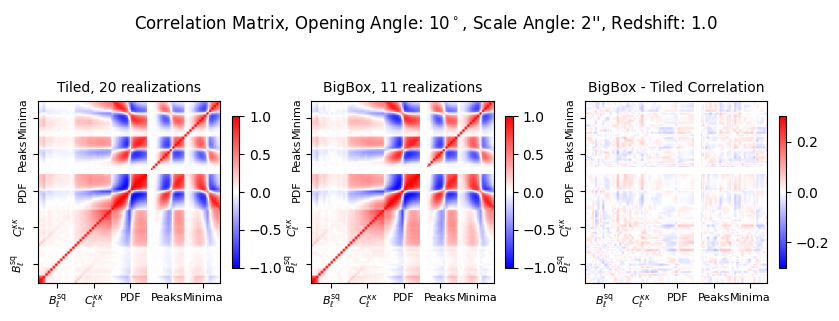

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_ngal7_sl2.png


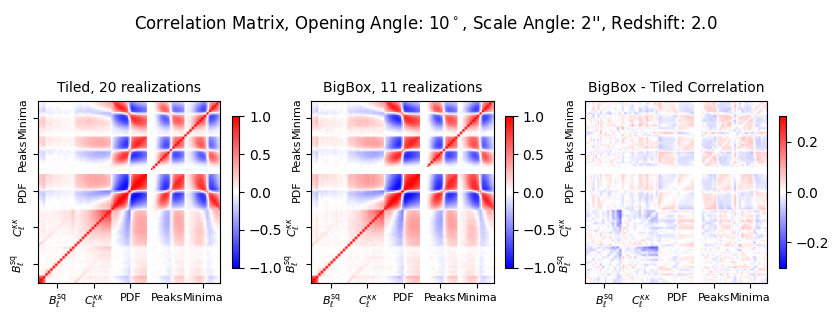

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_ngal50_sl2.png


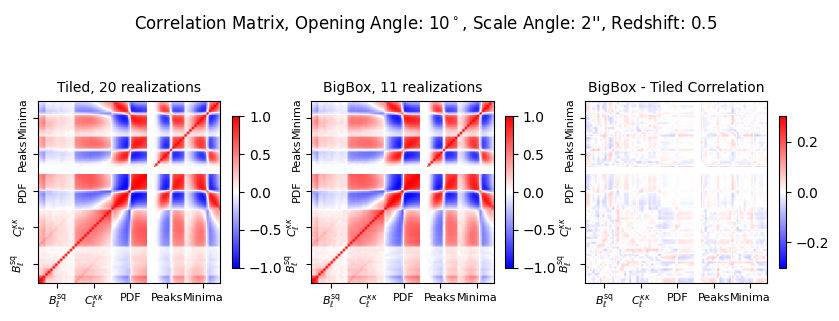

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_ngal50_sl2.png


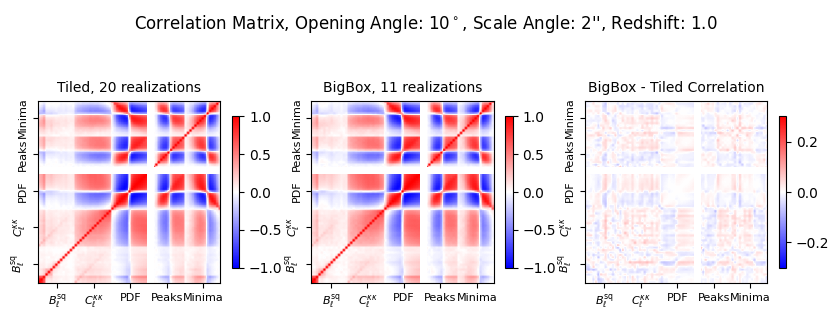

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_ngal50_sl2.png


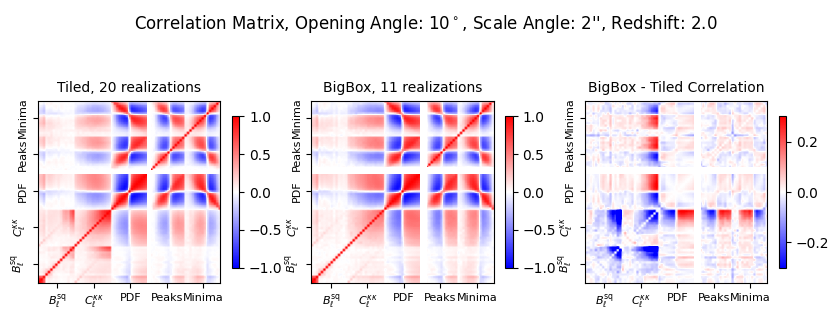

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_ngal50_sl8.png


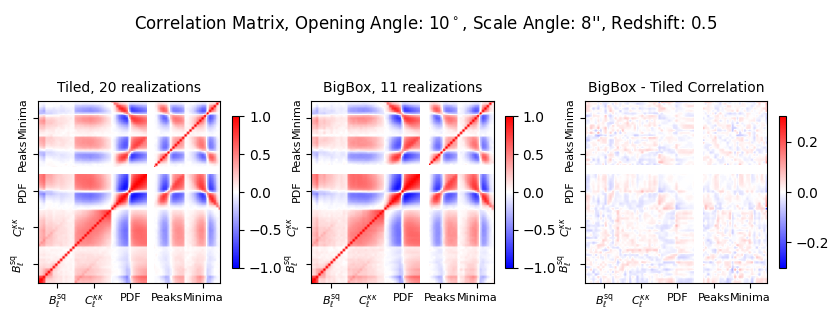

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_ngal50_sl8.png


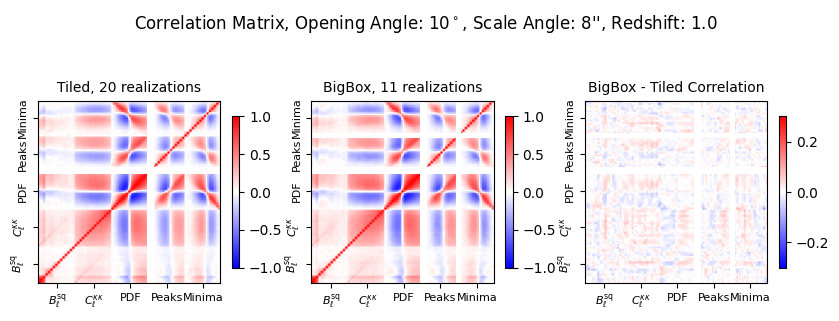

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_ngal50_sl8.png


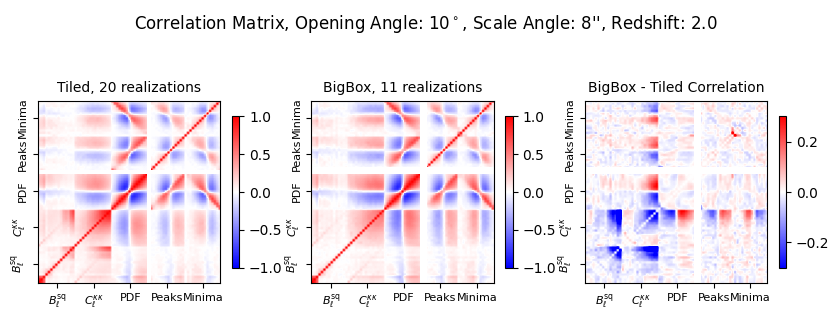

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_noiseless_sl5.png


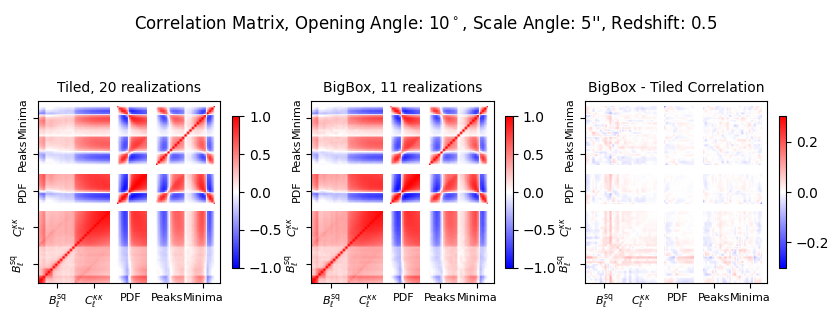

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_noiseless_sl5.png


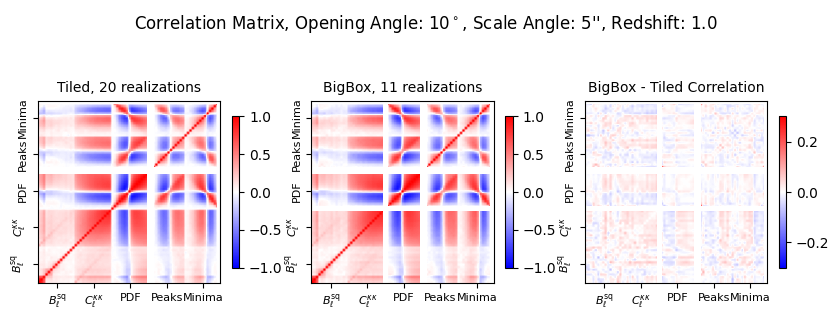

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_noiseless_sl5.png


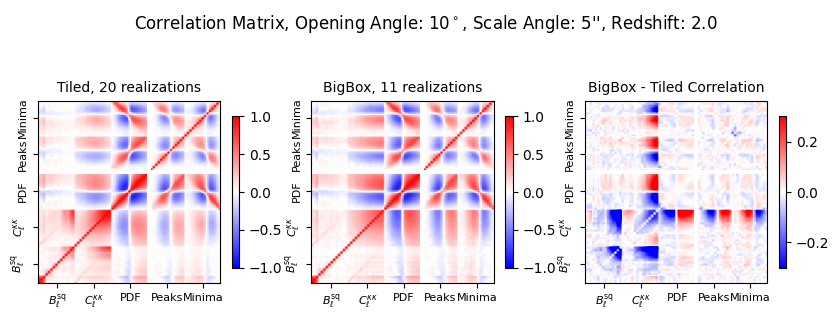

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_ngal7_sl5.png


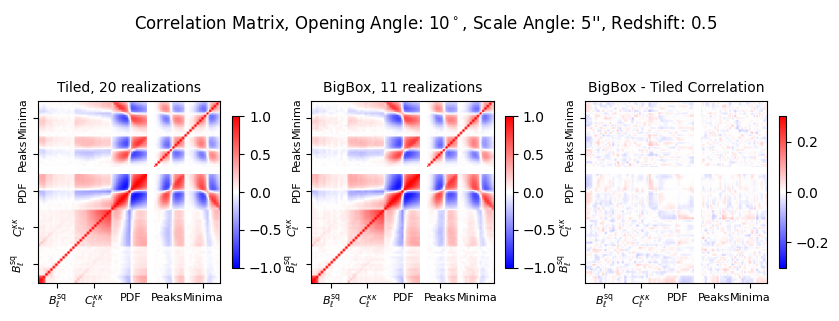

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_ngal7_sl5.png


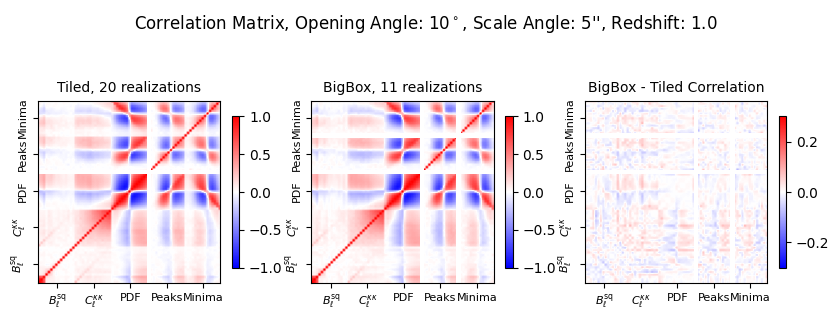

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_ngal7_sl5.png


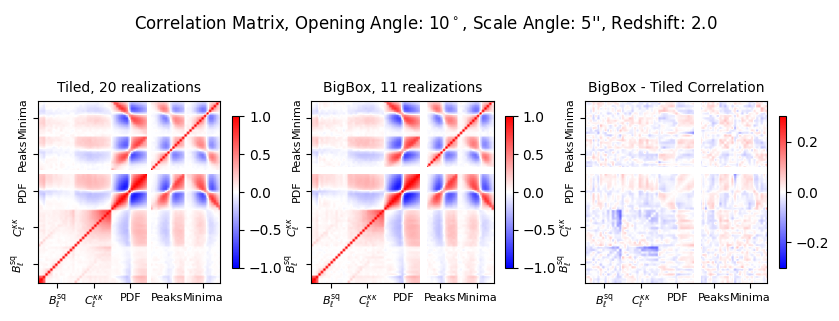

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_ngal50_sl5.png


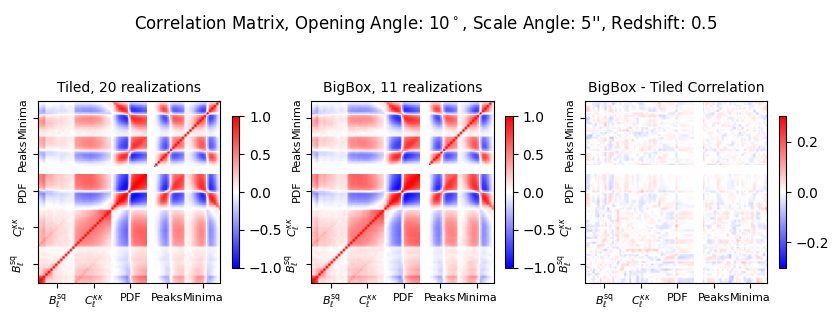

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_ngal50_sl5.png


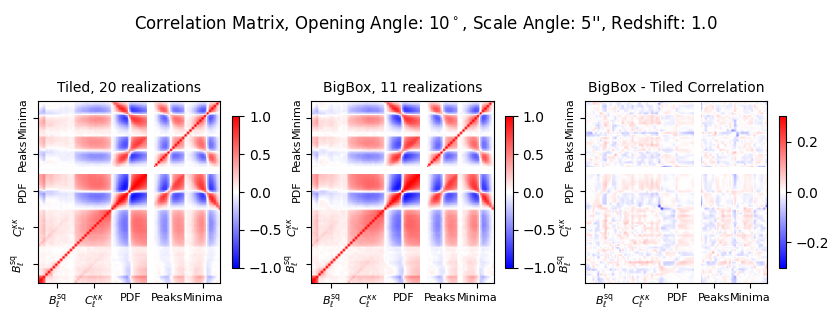

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_ngal50_sl5.png


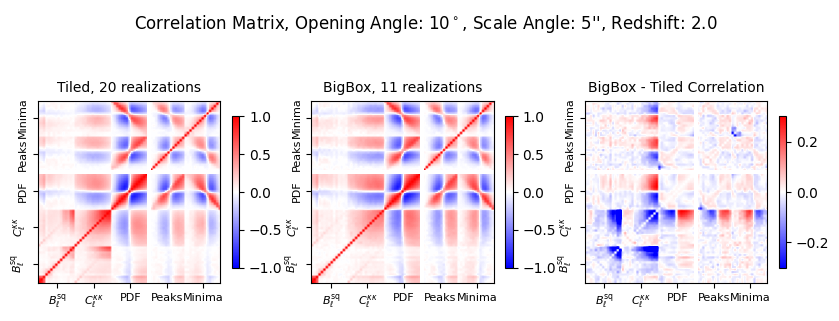

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_noiseless_sl10.png


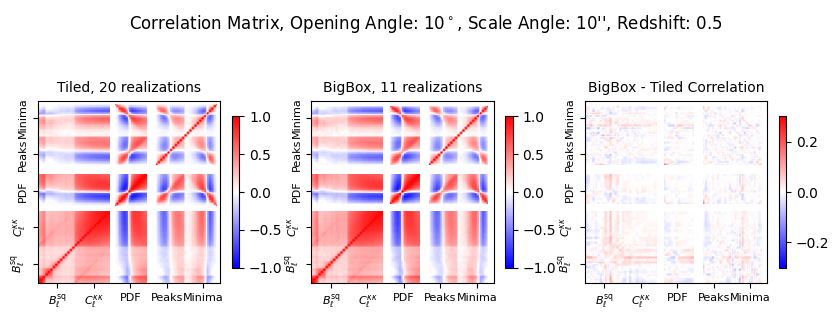

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_noiseless_sl10.png


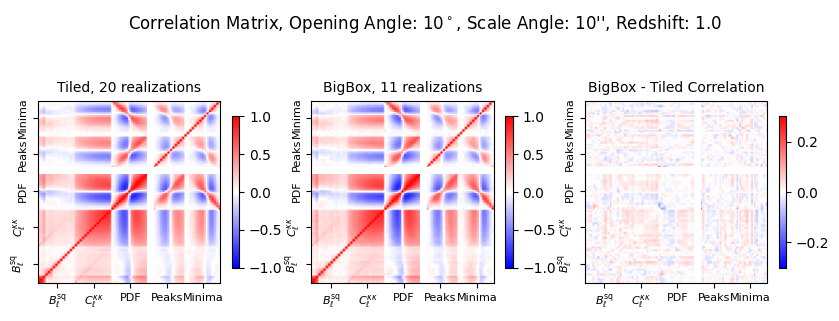

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_noiseless_sl10.png


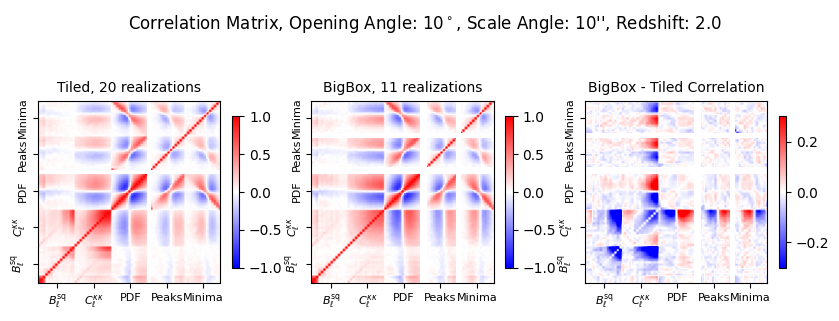

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_ngal30_sl5.png


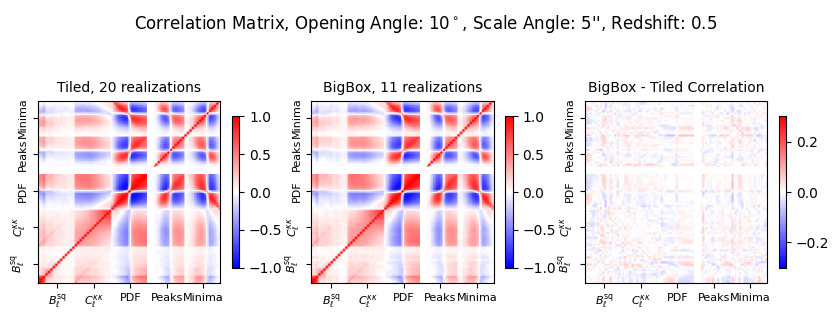

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_ngal30_sl5.png


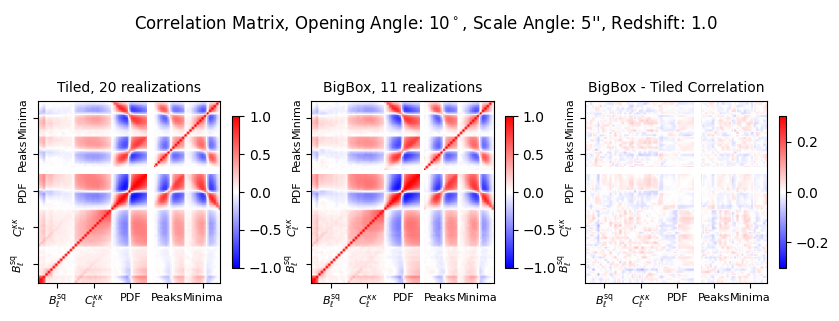

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_ngal30_sl5.png


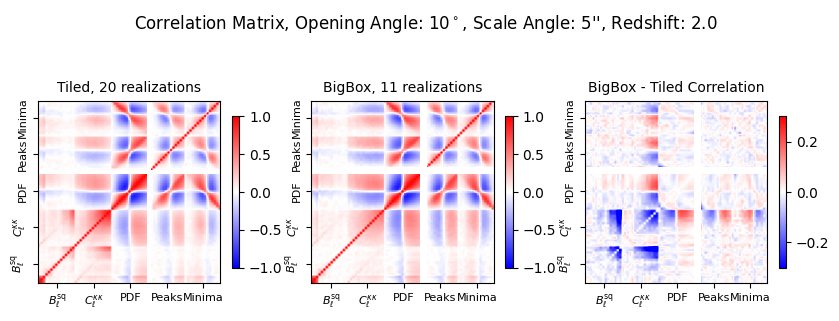

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_ngal7_sl8.png


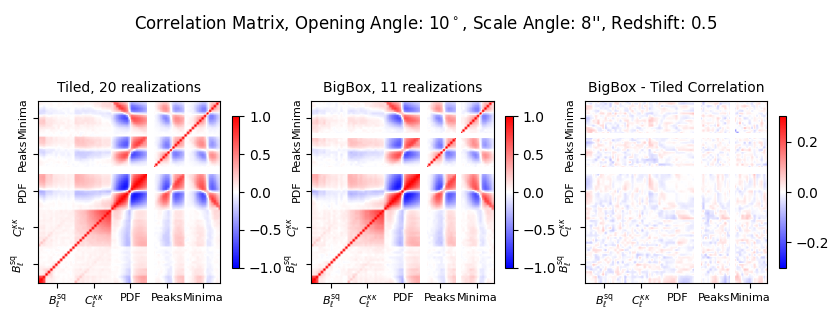

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_ngal7_sl8.png


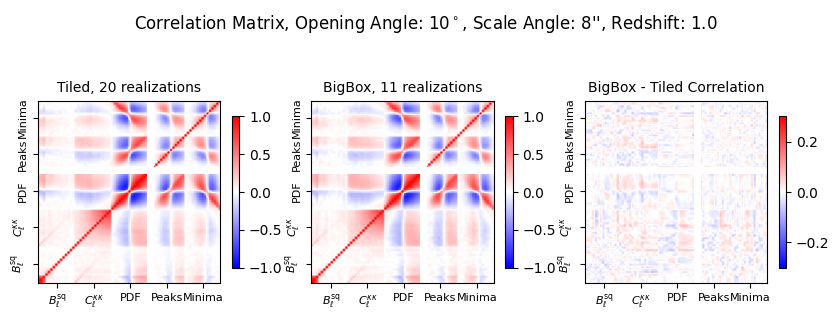

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_ngal7_sl8.png


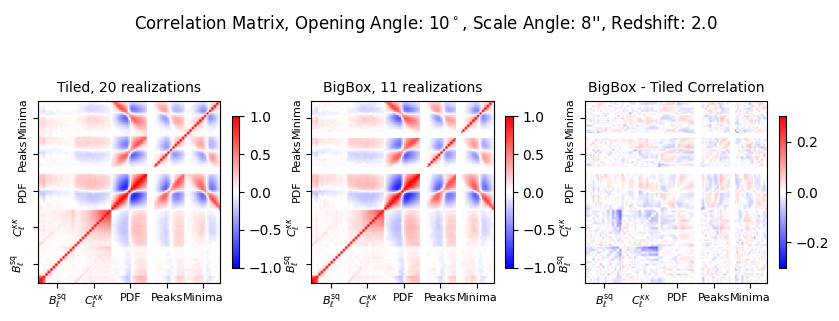

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_ngal30_sl10.png


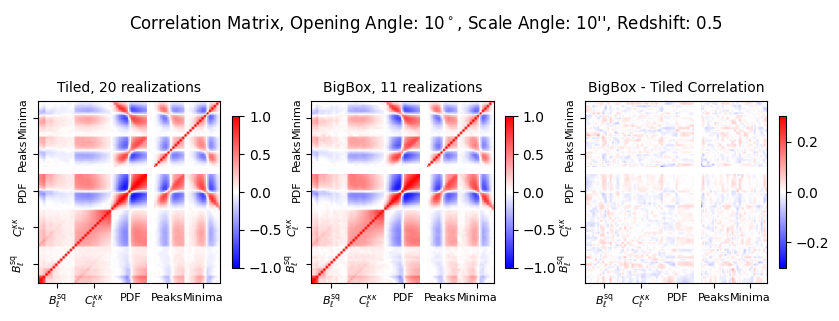

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_ngal30_sl10.png


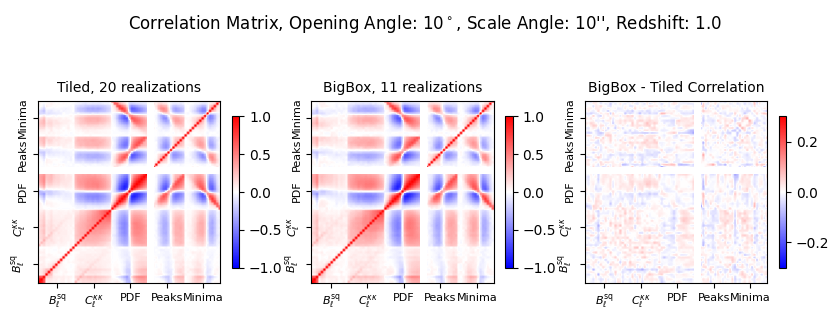

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_ngal30_sl10.png


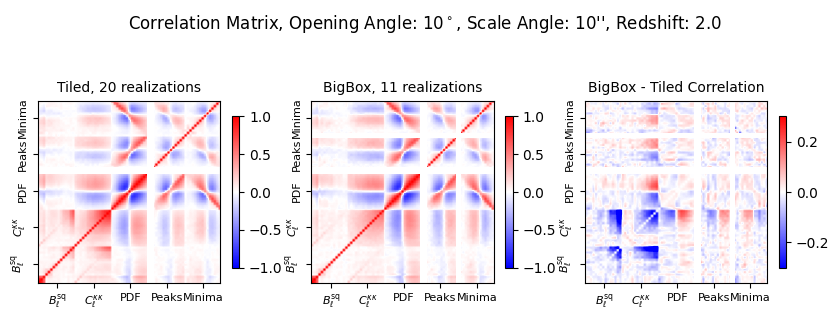

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_ngal50_sl10.png


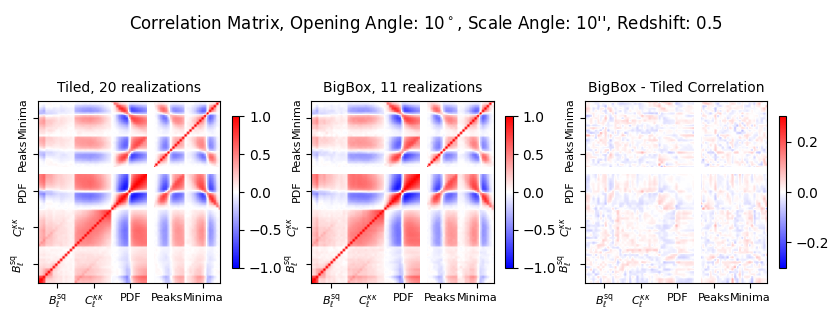

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_ngal50_sl10.png


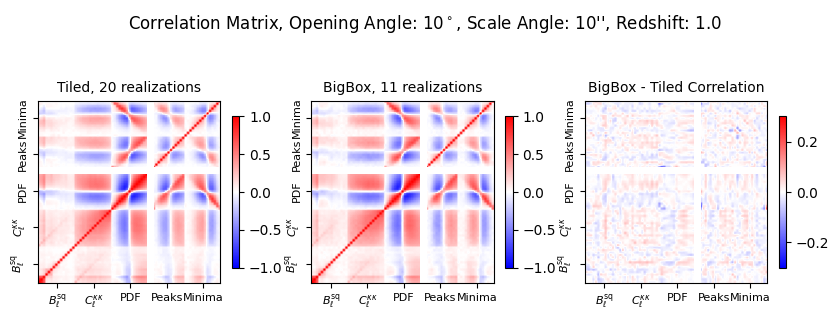

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_ngal50_sl10.png


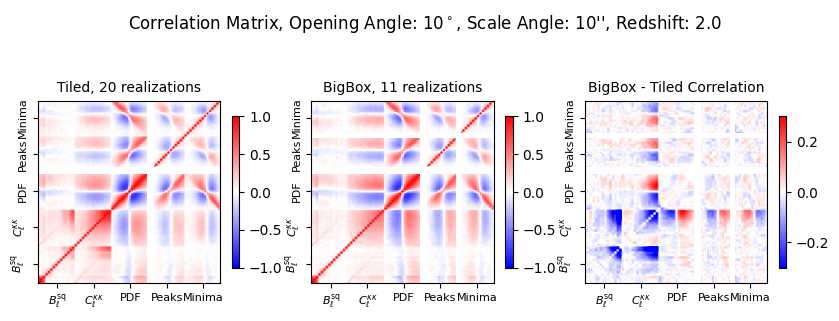

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_noiseless_sl8.png


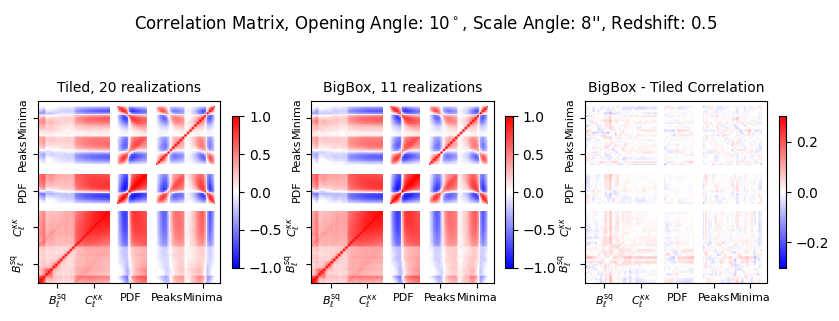

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_noiseless_sl8.png


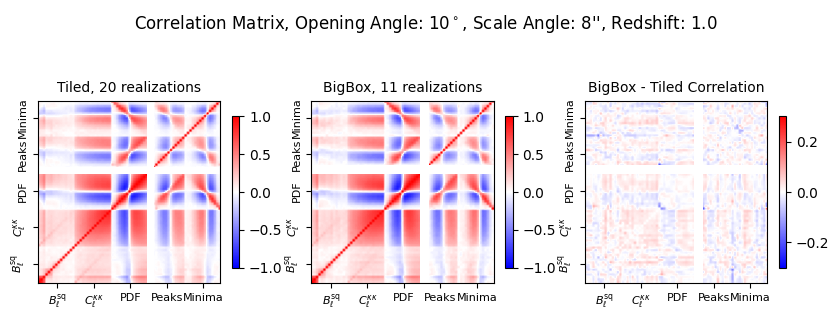

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_noiseless_sl8.png


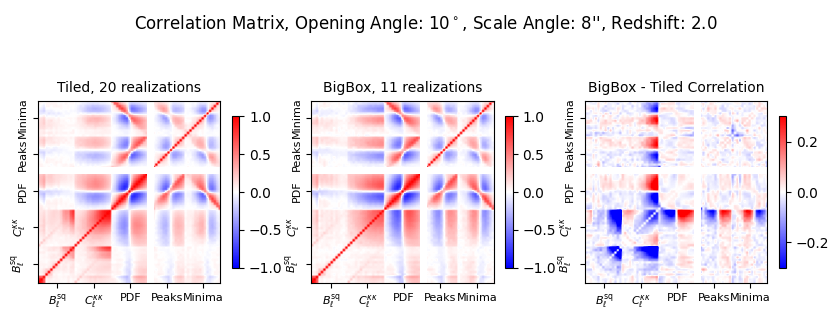

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_ngal15_sl8.png


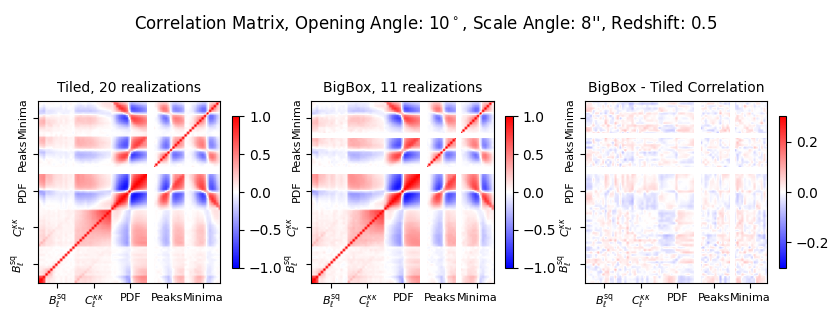

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_ngal15_sl8.png


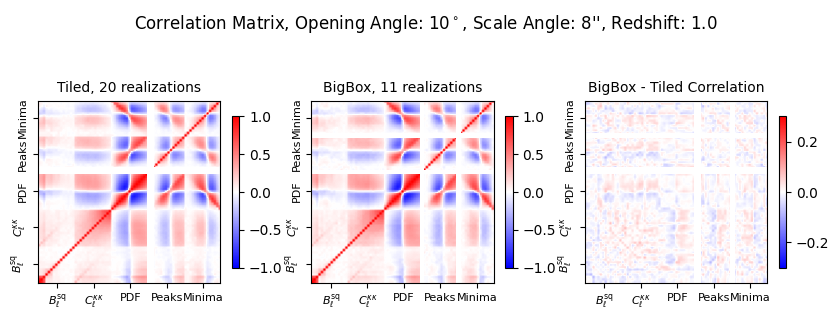

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_ngal15_sl8.png


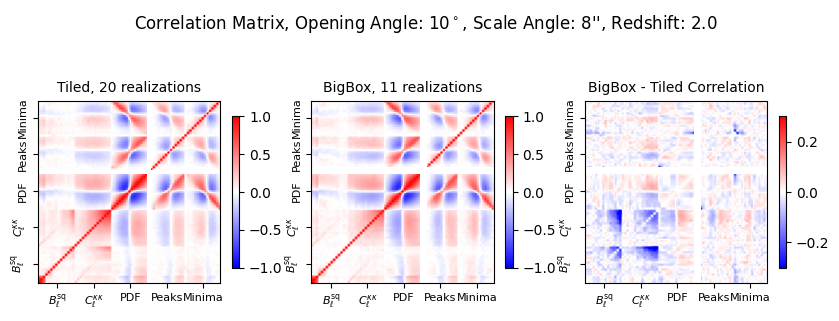

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_ngal15_sl2.png


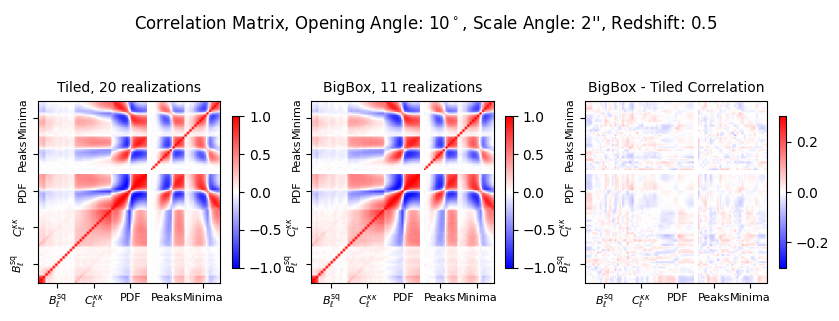

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_ngal15_sl2.png


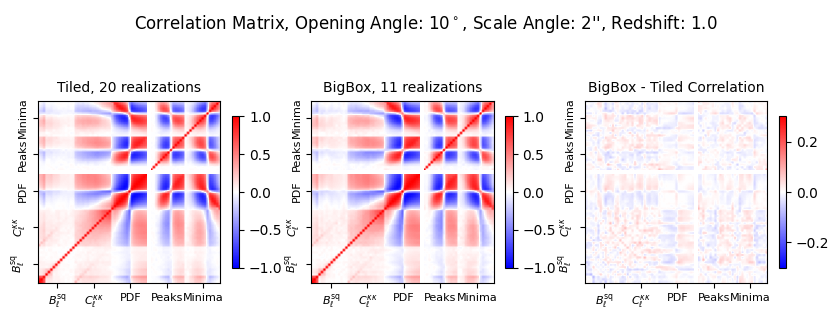

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_ngal15_sl2.png


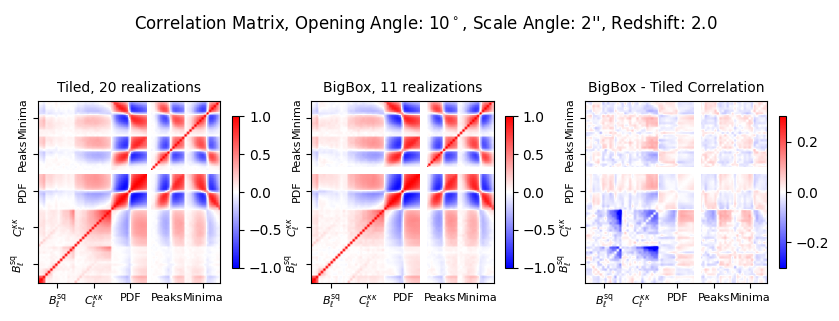

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_ngal15_sl5.png


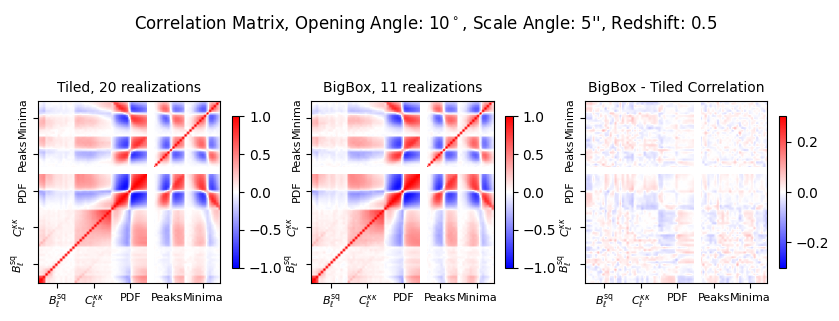

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_ngal15_sl5.png


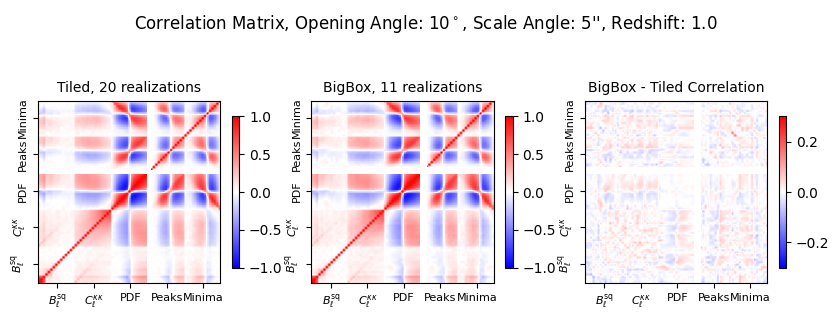

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_ngal15_sl5.png


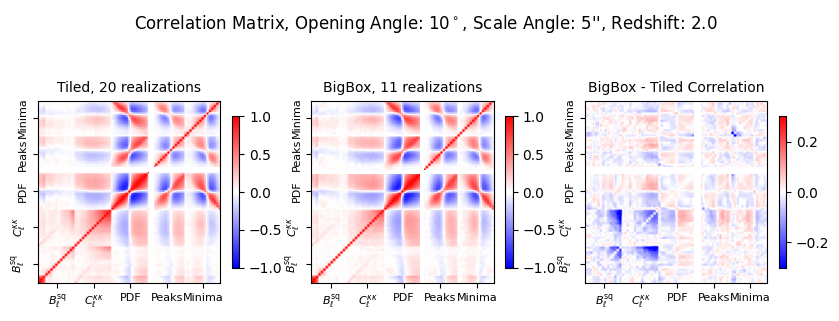

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_ngal30_sl8.png


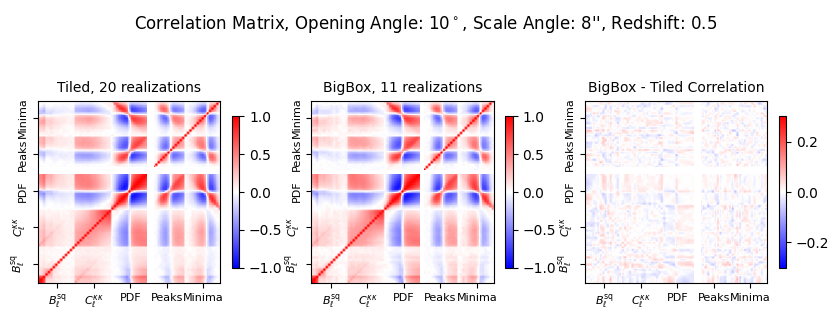

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_ngal30_sl8.png


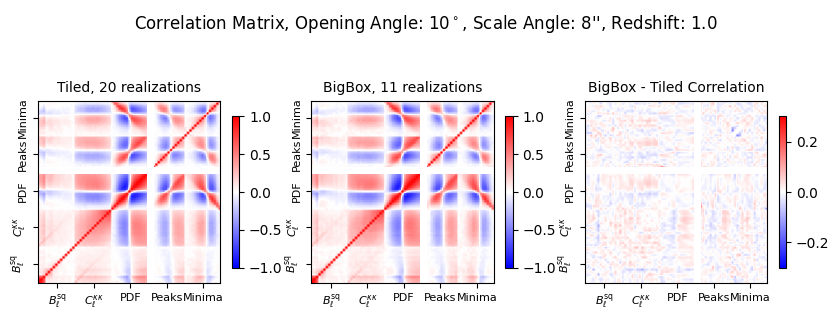

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_ngal30_sl8.png


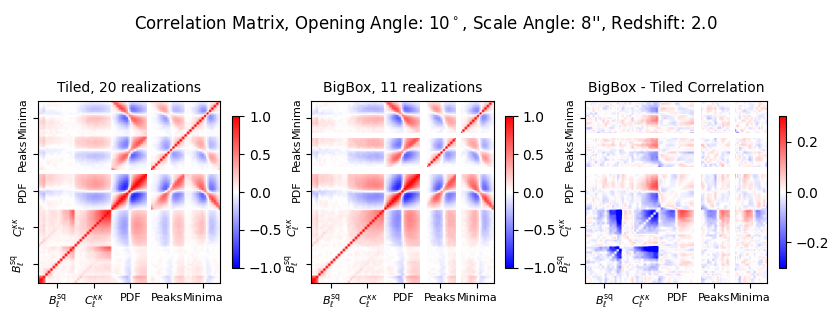

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_noiseless_sl2.png


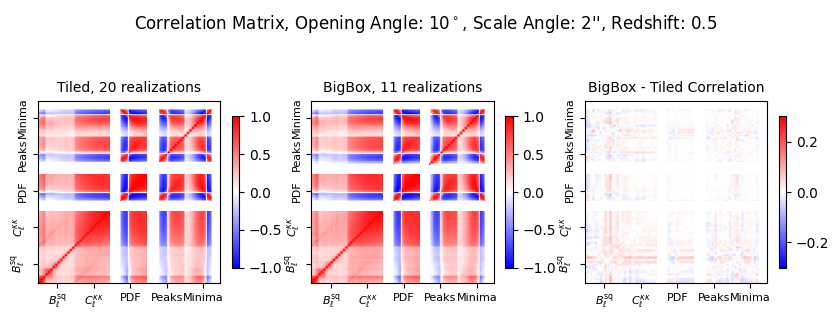

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_noiseless_sl2.png


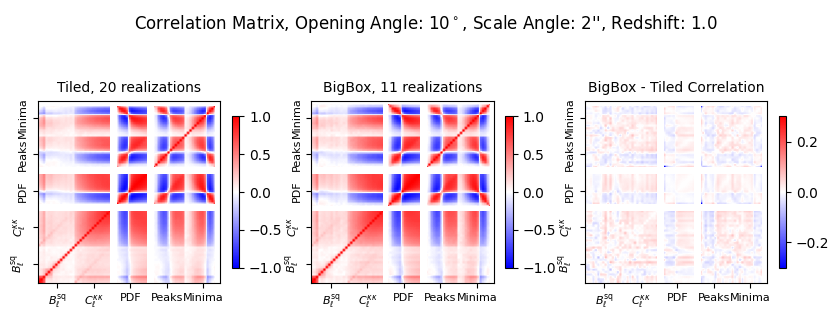

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_noiseless_sl2.png


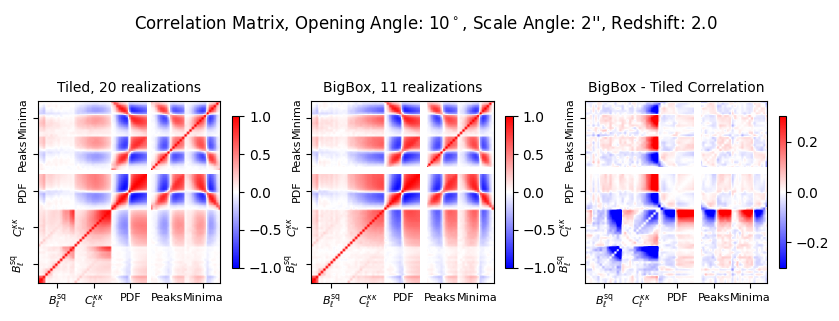

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs0.5_oa10_ngal7_sl10.png


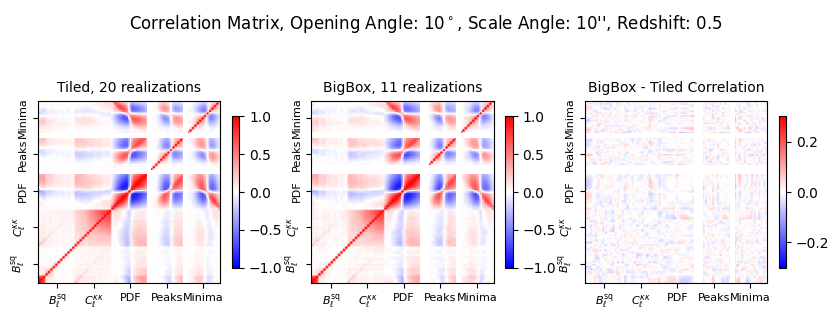

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs1.0_oa10_ngal7_sl10.png


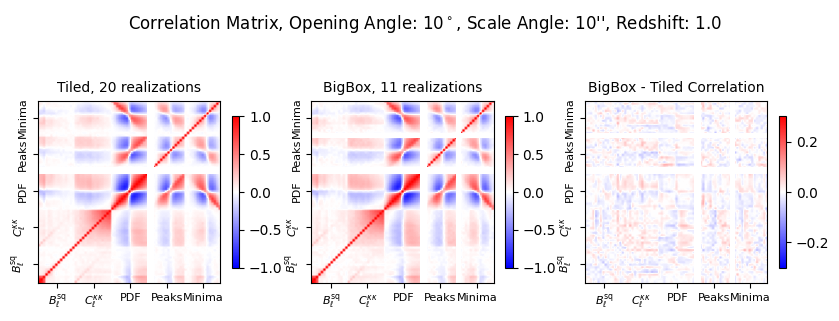

Saved: /lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr/corr_zs2.0_oa10_ngal7_sl10.png


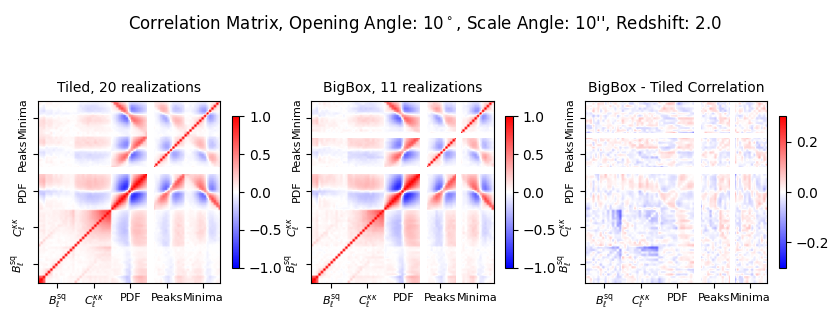

In [6]:

data_tiled_paths = glob.glob("/lustre/work/akira.tokiwa/Projects/LensingSSC/output/patch_stats_tiled*.npy")


for data_tiled_path in data_tiled_paths:
    data_bigbox_path = data_tiled_path.replace("tiled", "bigbox")

    data_tiled = np.load(data_tiled_path, allow_pickle=True).item()
    data_bigbox = np.load(data_bigbox_path, allow_pickle=True).item()
    info = InfoExtractor.extract_info_from_path(data_tiled_path)
    sl = info["sl"]
    oa = info["oa"]
    ngal = info["ngal"]
    noise = f"ngal{ngal}" if ngal != 0 else "noiseless"

    for zs in [0.5, 1.0, 2.0]:
        fname = os.path.join("/lustre/work/akira.tokiwa/Projects/LensingSSC/plot/corr", f"corr_zs{zs}_oa{oa}_{noise}_sl{sl}.png")
        title = f"Correlation Matrix, Opening Angle: {oa}"+r"$^\circ$,"+f" Scale Angle: {sl}"+r"''"+f", Redshift: {zs}"
        title_tiled = f"Tiled, 20 realizations"
        title_bigbox = f"BigBox, 11 realizations"
        labels = [r'$B_{\ell}^\mathrm{sq}$', r'$C^{\kappa\kappa}_{\ell}$', "PDF", "Peaks", "Minima"]

        corr_tiled = data_tiled[zs]["corr"]
        corr_bigbox = data_bigbox[zs]["corr"]

        plot_corr(fname, corr_tiled, corr_bigbox, title, title_tiled, title_bigbox, labels)